In [1]:
import src.d07_visualization.q4_visualization_module as q4_vis

To answer the question of what, if any, relationship exists between the category of EMS call outcome and station across shifts? we created a new data frame based on the Patients dataset. The data frame was focused on the FireStation, Shift, PatientOutcome, PatientId and DispatchTime columns and any duplicate values within the data frame were removed. Performing this conditioning prior to analysis allowed us to account each patient outcome once.

In [2]:
df = q4_vis.q4_data_frame()
cols = ['PatientOutcome', 'FireStation', 'Shift']
df=df[cols].astype('category').copy()
df.rename(columns = {'PatientOutcome': 'EMS Call Outcome',
                     'FireStation': 'Fire Station',
                     'Shift': 'Shift'}, inplace=True)
df.describe()

,EMS Call Outcome,Fire Station,Shift
count,246928,246928,246928
unique,12,38,3
top,Treated & Transported,11,C - Shift
freq,164397,14586,82841


For this particular question, the main variables are categorical values and the above table provides key information to describe them. For instance, we can observe that each variable has between three (3) and thirty-eight (38) unique values. Since these variables contain categorical data, we will leverage frequency and violin plots to provide insights about the EMS call outcome distribution.

Due to the number of levels and variables we have in this question, we will present the analysis using a top-to-bottom approach. In other words, we will start providing insights at the highest level possible and drill down to the individual EMS call outcome. 

### EMS Call Outcome Distribution Across Fire Stations

Analysis of the EMS call outcome distribution across all of the 38 fire stations allowed us to observe that most of the call outcomes are concentrated at four (4) specific EMS call outcomes (i.e., Treated & Transported, Patient Refusal (AMA), No Treatment/Transport Required, and Canceled (Prior to Arrival)). Additionally, we can see that the EMS call outcome that is the most frequently reported is Treated & Transported. It is for this difference that the violin plots presented in this section are presented twice; one plot will show the overall distribution for all EMS call outcomes while the second plot shows the overall distribution after removing Treated & Transported from the analysis.

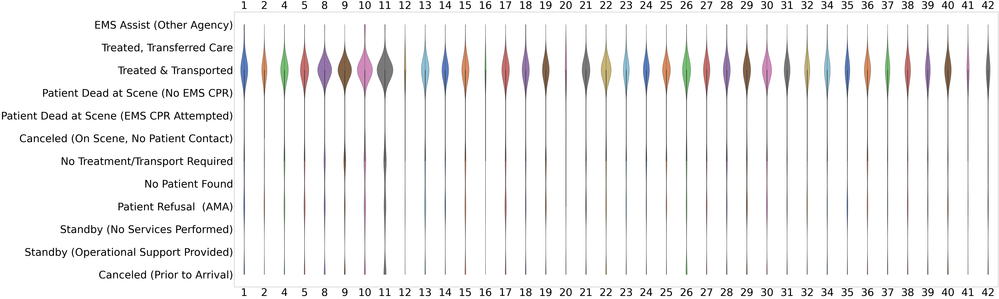

In [3]:
q4_vis.violinplot(0,'withTreated')

**Figure 1:** EMS call outcome Treated & Transported shows a higher frequency count among all the EMS call outcomes. Fire stations 8, 9, 10, and 11 show the top frequency counts while fire stations 12, 16, 20, and 41 show the lowest frequency counts.

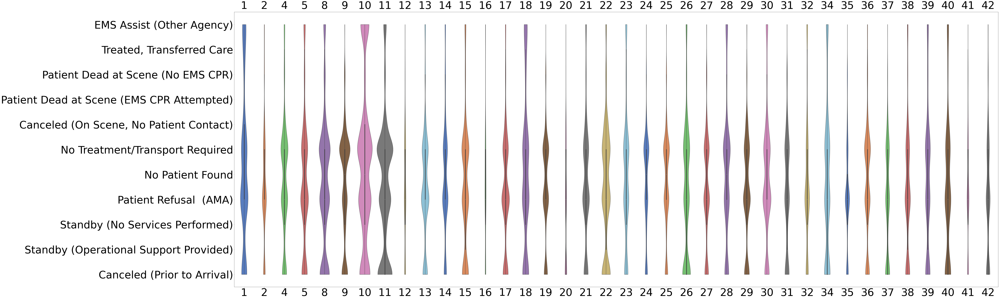

In [4]:
q4_vis.violinplot(0,'withoutTreated')

**Figure 2:** Denser distribution is shown between No Treatment/Transport Required and Patient Refusal (AMA) EMS call outcomes. In this instance we can also observe that fire stations 8, 9, 10, and 11 show the top frequency counts for No Treatment/Transport Required while fire stations 12, 16, 20, and 41 show the lowest frequency counts. However, fire station 9 shows a frequency count drop for Patient Refusal (AMA) outcome.

The violing plot without Treated & Transported EMS call outcome presents two potential indicators of interest. The first indicator is that some stations (e.g., fire station 2 and 35) show a lighter distribution for No Treatment/Transport required. The second potential indicator is that fire station 9 presents a significant frequency drop between No Treatment/Transport required and Patient Refusal (AMA).

Another approach we followed, based on the subject matter expertise from the Fairfax County Fire and Rescue Department (FCFRD), was to observe the distribution after merging the EMS call outcome categories as follow:
* Combine Treated, Transferred Care and EMS Assist (Other Agency) into a single category called Assist.
* Rename Treated & Transported category to Transport
* Combine Patient Dead at Scene (No EMS CPR) and Patient Dead at Scene (EMS CPR Attempted) into a single category called Dead
* Combine Canceled (On Scene, No Patient Contact), No Treatment/Transport Required, and No Patient Found in a single category called No Patient
* Rename Refused (AMA) category to Refused
* Combine Standby (No Services Performed) and Standby (Operational Support Provided) into a single category called Standby
* Rename Canceled (Prior to Arrival) category to Canceled


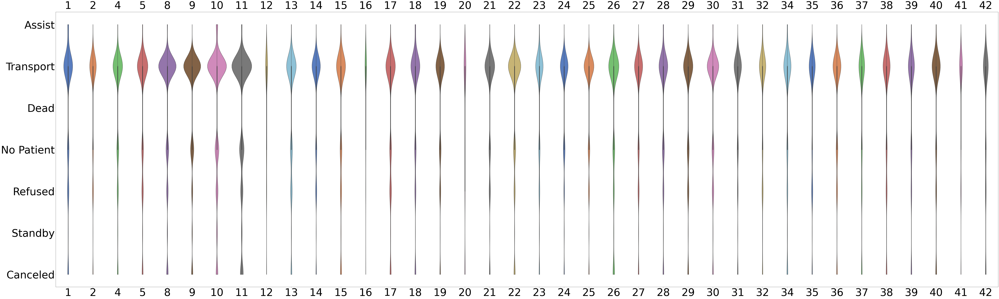

In [5]:
q4_vis.violinplot(0,'new_cat_withTreated')

**Figure 3:** New EMS call outcome categories distribution across fire stations maintains the distribution pattern previously shown. However, it simplifies the visualization by minimizing the number of outcomes from 12 to 7.

The new categories used to describe patient outcomes presents the same patterns and makes the distribution a little bit easier to observe. Observing the distributions presented in the two new violin plots above we can note that the Transport EMS call outcome continues to outweigh other EMS call outcomes, and similar pattern for the No Patient and Refused EMS call outcome. Also, some fire stations continue to show a different distribution between the No Patient and Refused outcome (for example, fire station 2 and 35).

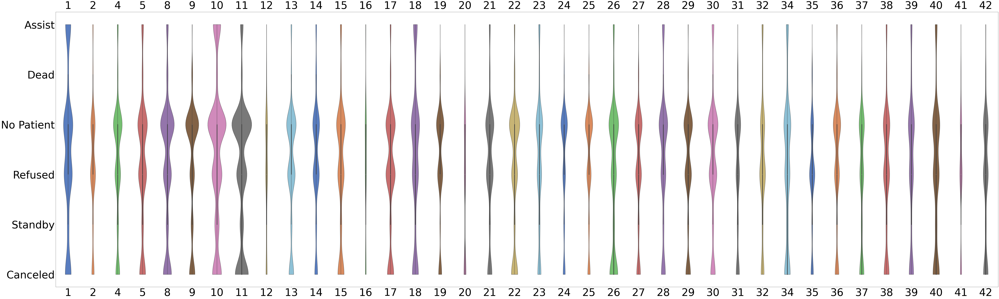

In [6]:
q4_vis.violinplot(0,'new_cat_withoutTreated')

**Figure 4:** Fire station 9 continue to show a peculiar frequency count drop between No Patient and Refused.

In addition to the violin plots for each EMS call outcome across fire station we worked a violin plot version that shows EMS call outcome distribution across fire station and shifts.

### EMS Call Outcome Distribution Across Fire Stations and Shifts

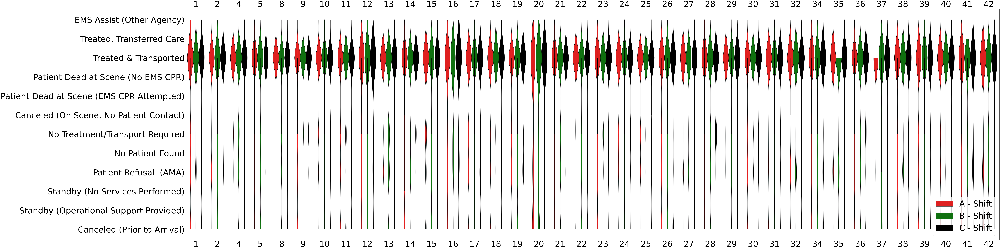

In [7]:
q4_vis.violinplot(1,'withTreated')

**Figure 5:** The violin plots show denser distribution for the Treated & Transported EMS call outcome. In addition, fire stations 35, 37, and 41 show instances where one shift did not record EMS call outcome for the two top EMS call outcomes.

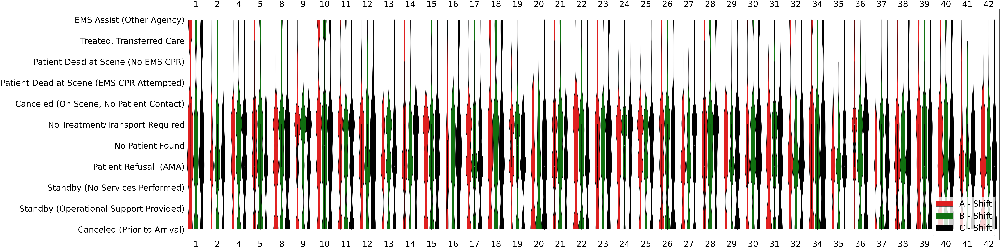

In [8]:
q4_vis.violinplot(1,'withoutTreated')

**Figure 6:** Fire station 1 seems to be denser distribution in shift A, followed by shift C and B. While fire station 12 seems to have denser distribution in shift C, followed by shift B and A.

The shift breakdown shown in the EMS call outcome distributions across fire station and shift makes the visualization a little busy, but the underlying distribution pattern is the same. The main benefit of this visualization is that opportunity to observe distribution pattern between shifts and at first glance we can note that the distribution is not exactly the same across shifts.

### 3.5.3	Individual Call Outcome Distribution Across Fire Stations and Shifts

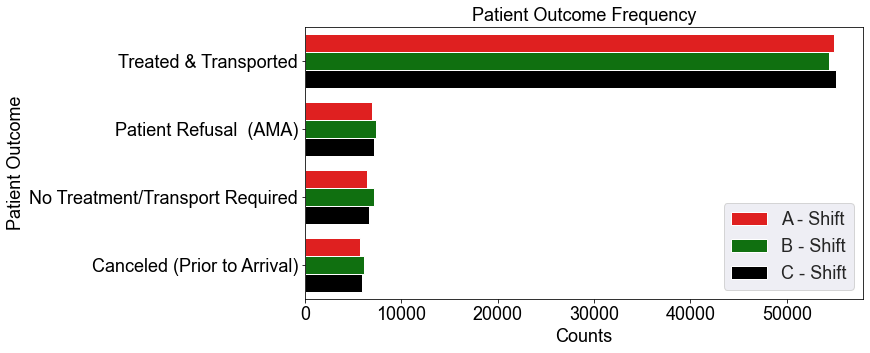

In [9]:
# This plot is a special version of the frequency plot for each EMS call outcome across shift. Its creation is only to focus the view on the top 4 outcomes.
q4_vis.presentation_frequency_plot_figures('Top 4 Outcomes')

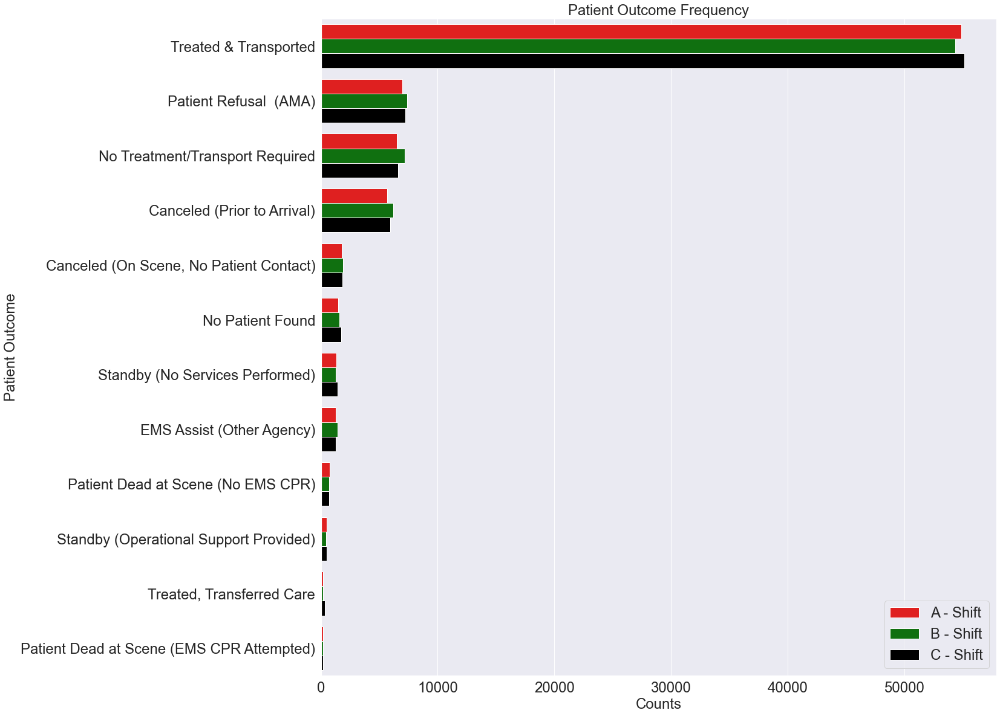

In [10]:
q4_vis.presentation_frequency_plot_figures('Outcome')

**Figure 7:** Aside of the frequency count differences among each EMS call outcome, we can observe that shift B presents the least frequency count for Treated & Transported and the highest count for Patient Refusal (AMA), No Treatment/Transport Required, and Canceled (Prior to Arrival).

The figures shown before presented several key indicators that drove most of our conversations with FCFRD with respect to the relationship that may exist between EMS call outcome and fire stations across shift. Some of the new questions that these indicators created where:
* Why do some stations distributions in the violin plot (Figure 2) show a low frequency count for Treated, Transferred Care EMS call outcome?
* Why do some stations distributions in the violin plot (Figure 2) show a low frequency count for No Treatment/Transport Required EMS call outcome?
* Why is the B shift frequency (Figure 7) lower for Treated & Transported but higher for Patient Refusal and No Treatment/Transport Required?

Up to this point we have highlighted the main indicators found when studying the relationships between EMS call outcome and all fire stations or EMS call outcome and all fire stations across shift. The rest of this section focuses on presenting the frequency distribution for each individual EMS call outcome with observations about the frequency range and shift differences observed.

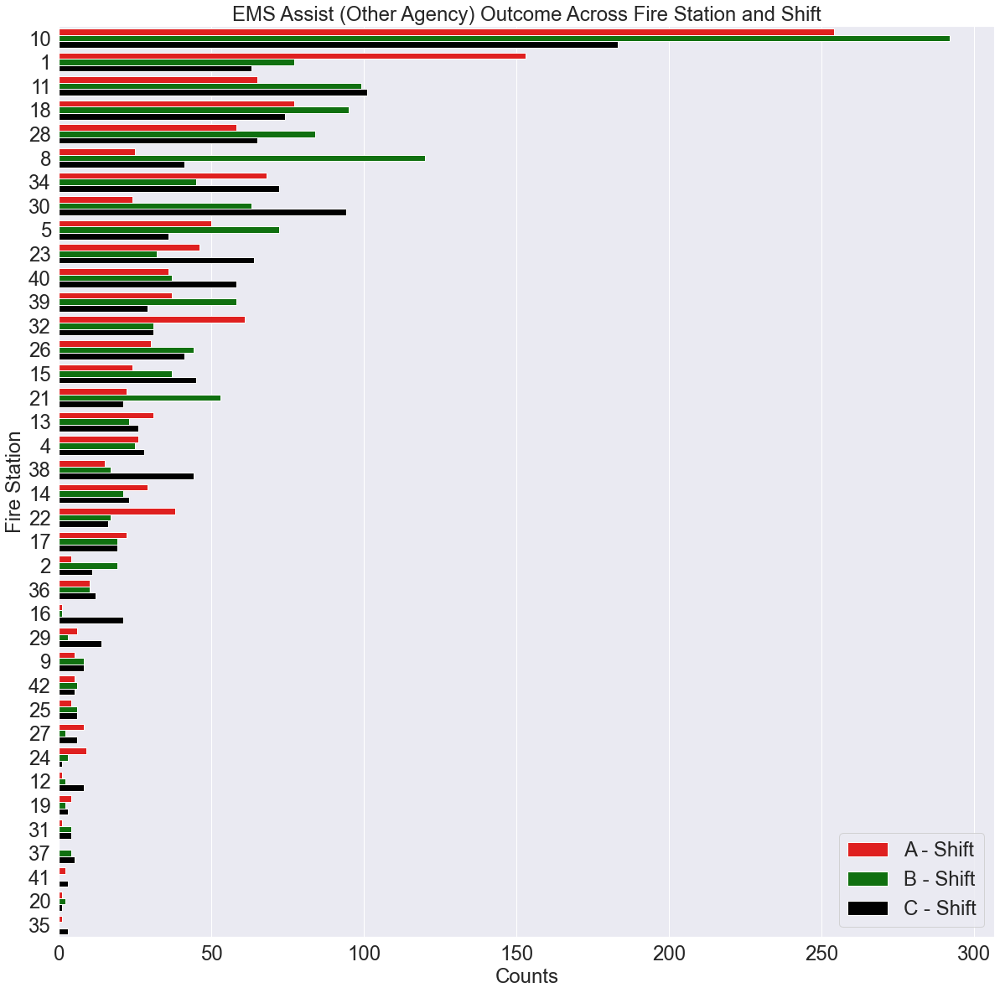

In [11]:
q4_vis.presentation_frequency_plot_figures('EMS Assist (Other Agency)')

**Figure 8:** EMS Assist (Other Agency) frequency count ranges from 0 to 300 and most of the stations do not exceeds the 50-count mark. Fire stations 37, 41, and 35 shows this EMS call outcome only in 2 of the 3 possible shifts. In addition, for this particular EMS call outcome shift B (1.4k) have most of the counts, followed by shift C (1.3k) and shift A (1.2k).

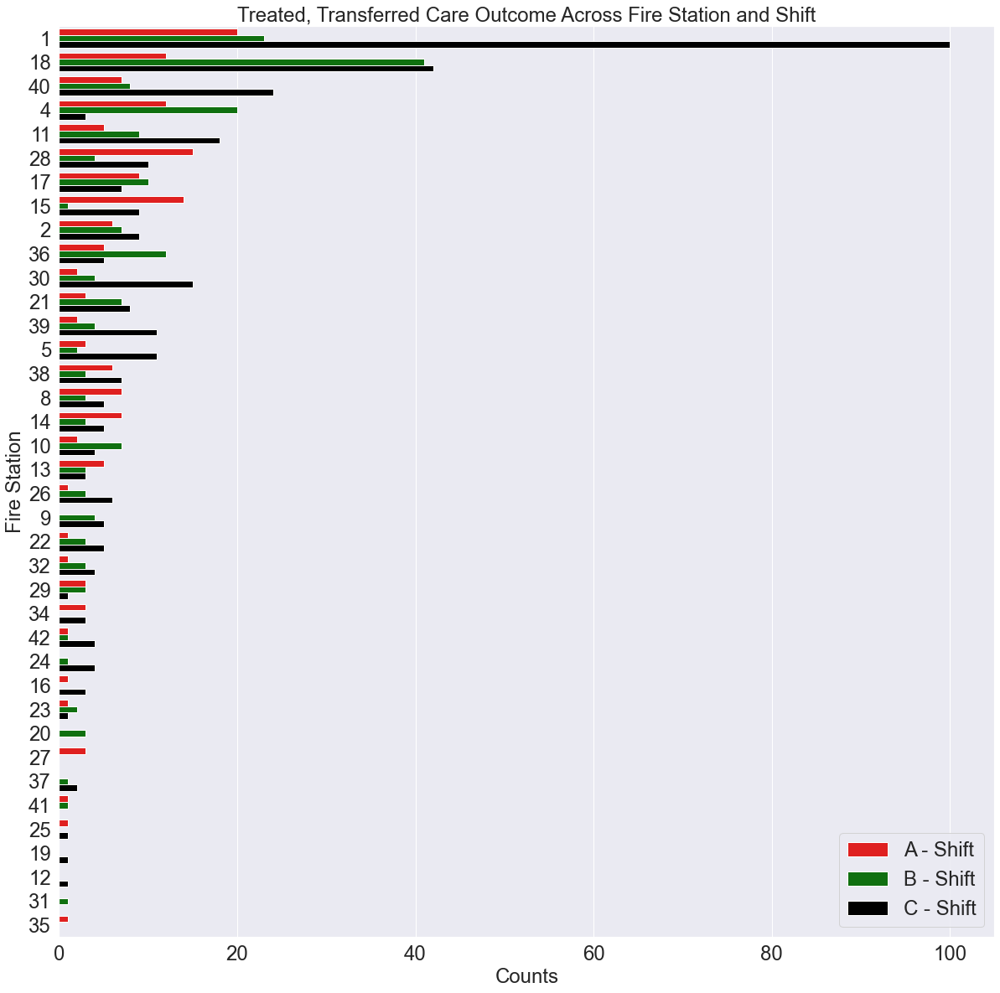

In [12]:
q4_vis.presentation_frequency_plot_figures('Treated, Transferred Care')

**Figure 9:** Treated, Transferred Care frequency count ranges from 0 to 100 and most of the stations do not exceeds the 20-count mark. Fire stations 27, 20, 31, 35, 19, and 12 shows this EMS call outcome only in 1 of the 3 possible shifts and fire stations 9, 34, 24, 16, 37, 41, and 25 shows this EMS call outcome only in 2 of the 3 possible shifts. In addition, for this particular EMS call outcome shift C (337) have most of the counts, followed by shift B (197) and shift A (160).
* The overall frequency count ranges from 0 to 100.

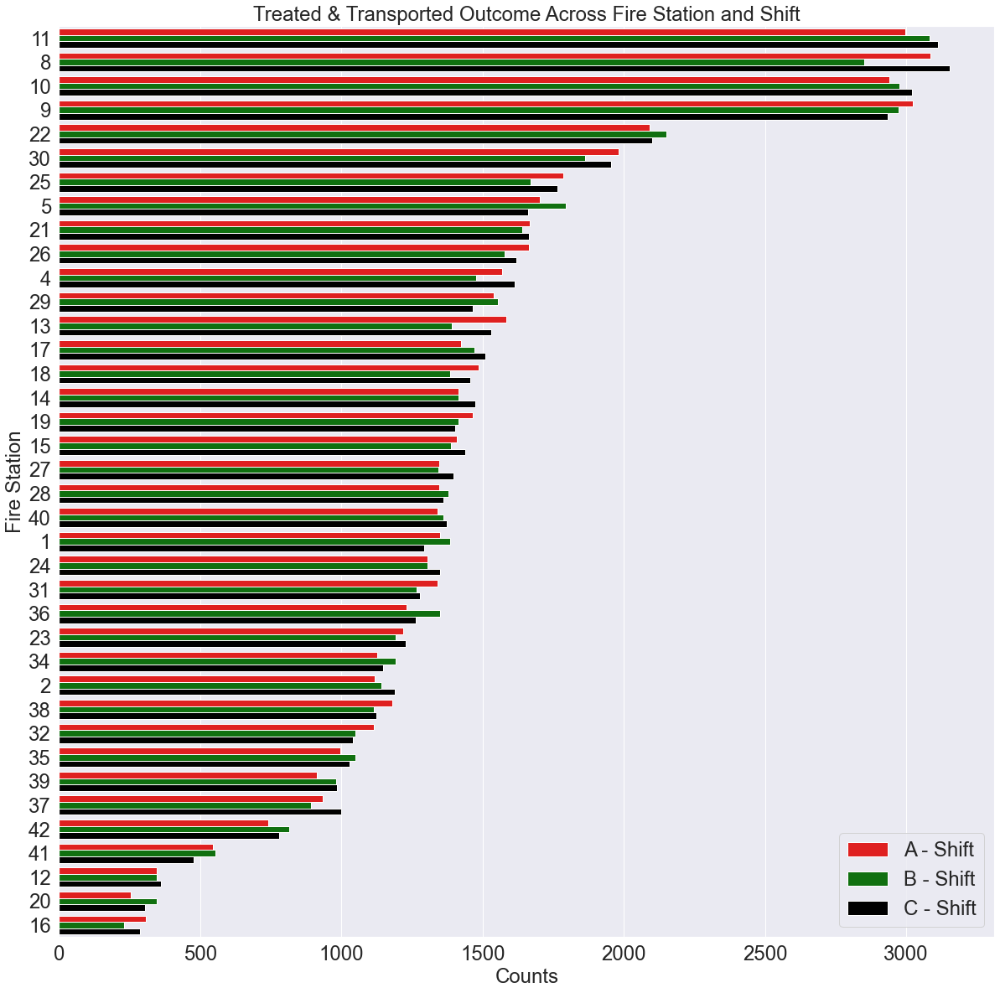

In [13]:
q4_vis.presentation_frequency_plot_figures('Treated & Transported')

**Figure 10:** Treated & Transported frequency count ranges from 0 to 3,500 and most of the stations exceeds the 1,000-count mark. While all fire stations present difference across shifts, station 8 seems to have the greatest difference between shifts, with shift B showing the least amount of Treated & Transport patient outcome. In addition, for this particular EMS call outcome shift C (55.1k) have most of the counts, followed by shift A (54.9k) and shift B (54.4k).

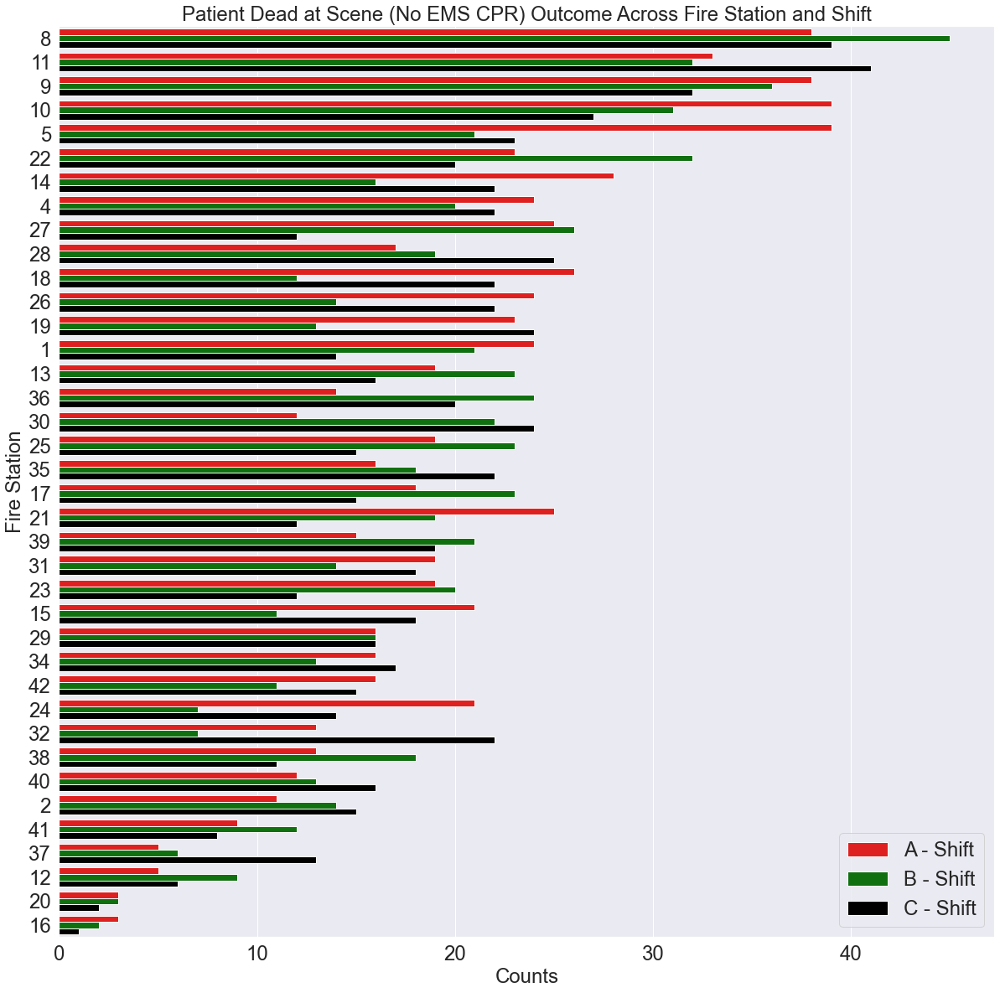

In [14]:
q4_vis.presentation_frequency_plot_figures('Patient Dead at Scene (No EMS CPR)')

**Figure 11:** Patient Dead at Scene (No EMS CPR) frequency count ranges from 0 to 50 and most of the stations meets or exceeds the 10-count mark. All fire stations accounted for this EMS call outcome across all shifts. In addition, for this particular EMS call outcome shift A (741) have most of the counts, followed by shift C (692) and shift B (687).

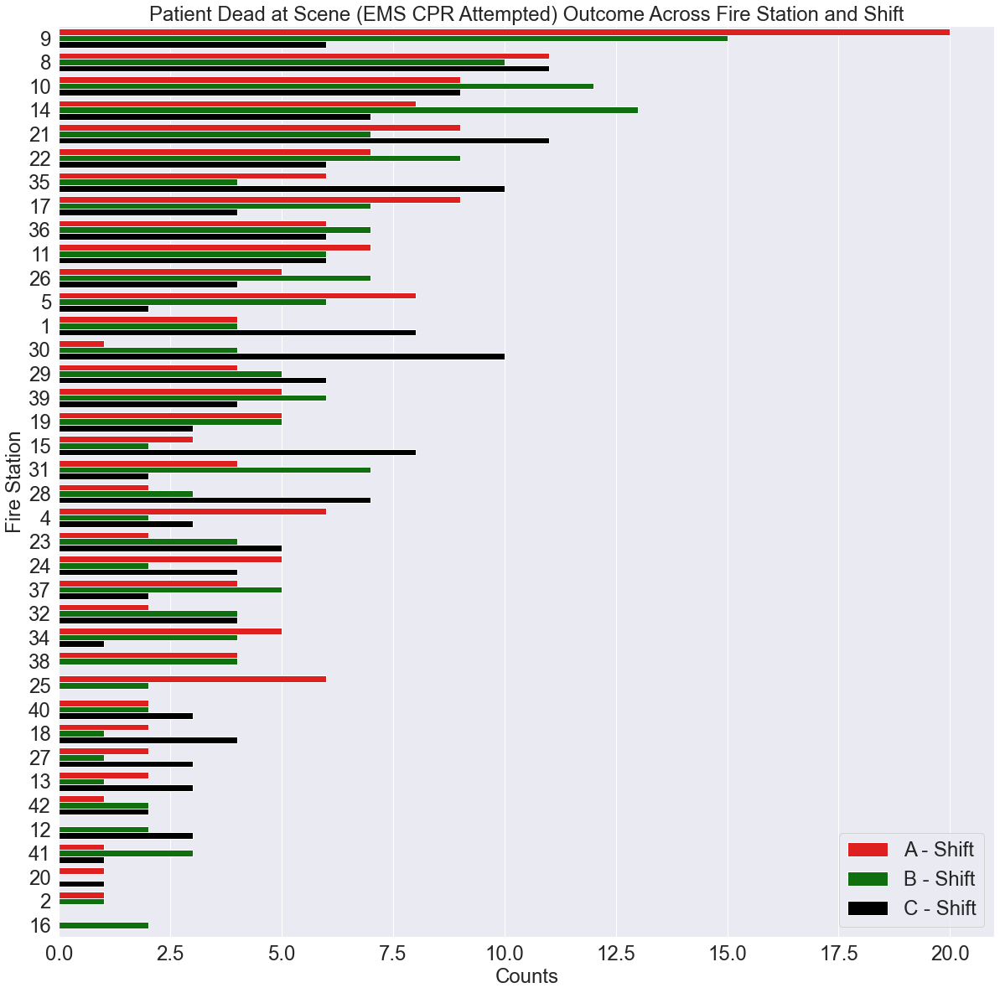

In [15]:
q4_vis.presentation_frequency_plot_figures('Patient Dead at Scene (EMS CPR Attempted)')

**Figure 12:** Patient Dead at Scene (EMS CPR Attempted) frequency count ranges from 0 to 20 and most of the stations meets or exceeds the 5-count mark. Fire station 16 shows this EMS call outcome only in 1 of the 3 possible shifts and fire stations 2, 12, 20, 25, and 38 shows this EMS call outcome only in 2 of the 3 possible shifts. In addition, for this particular EMS call outcome shift B (181) have most of the counts, followed by shift A (179) and shift C (169).

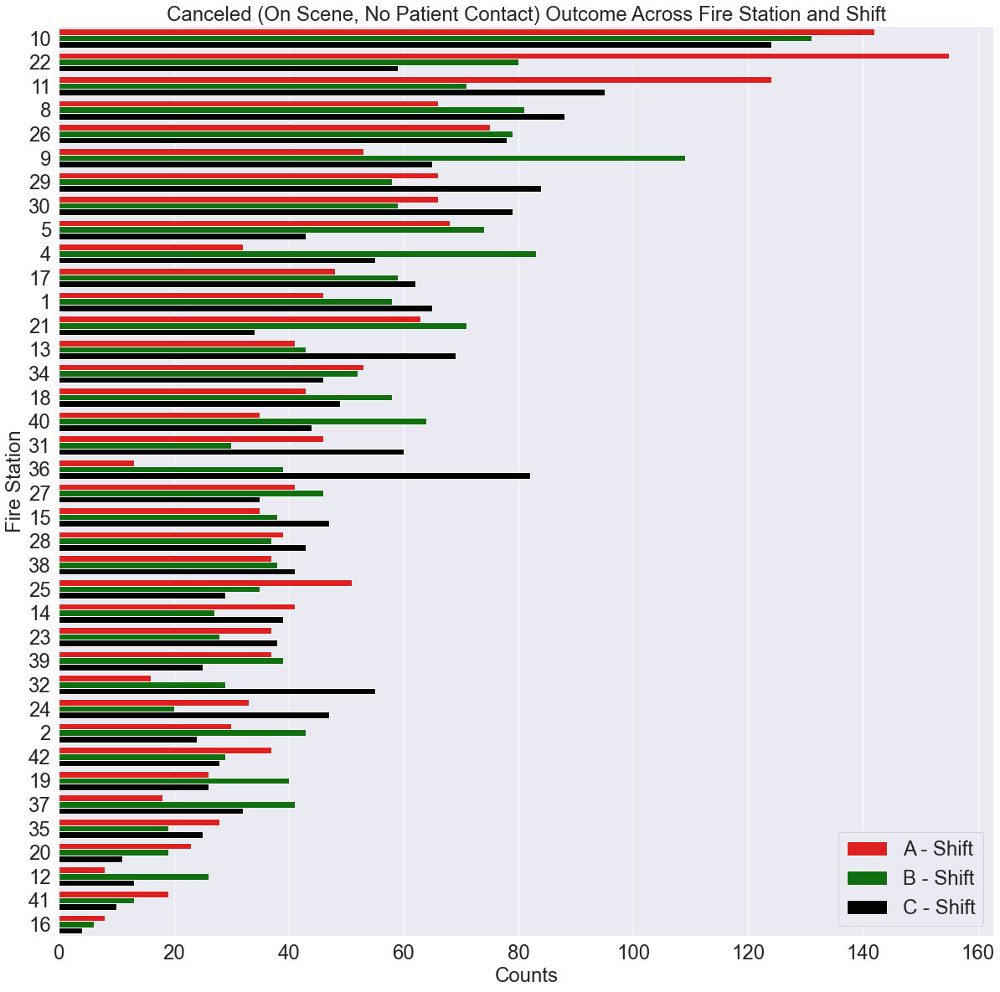

In [16]:
q4_vis.presentation_frequency_plot_figures('Canceled (On Scene, No Patient Contact)')

**Figure 13:** Canceled (On Scene, No Patient Contact) frequency count ranges from 0 to 160 and most of the stations meets or exceeds the 20-count mark. All fire stations accounted for this EMS call outcome across all shifts. In addition, for this particular EMS call outcome shift B (1.9k) have most of the counts, followed by shift C (1.8k) and shift A (1.8k).

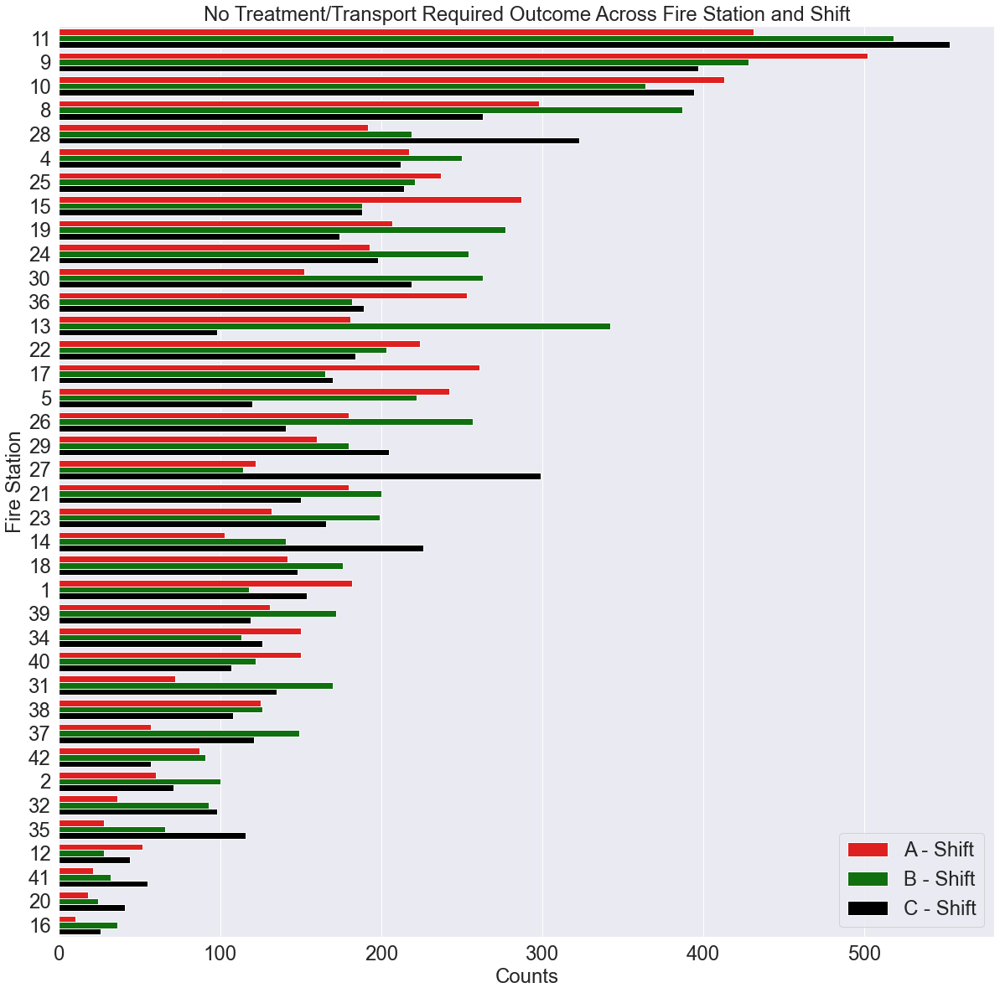

In [17]:
q4_vis.presentation_frequency_plot_figures('No Treatment/Transport Required')

**Figure 14:** No Treatment/Transport Required frequency count ranges from 0 to 600 and most of the stations meets or exceeds the 100-count mark. All fire stations accounted for this EMS call outcome across all shifts. In addition, for this particular EMS call outcome shift B (7.2k) have most of the counts, followed by shift C (6.6k) and shift A (6.5k).

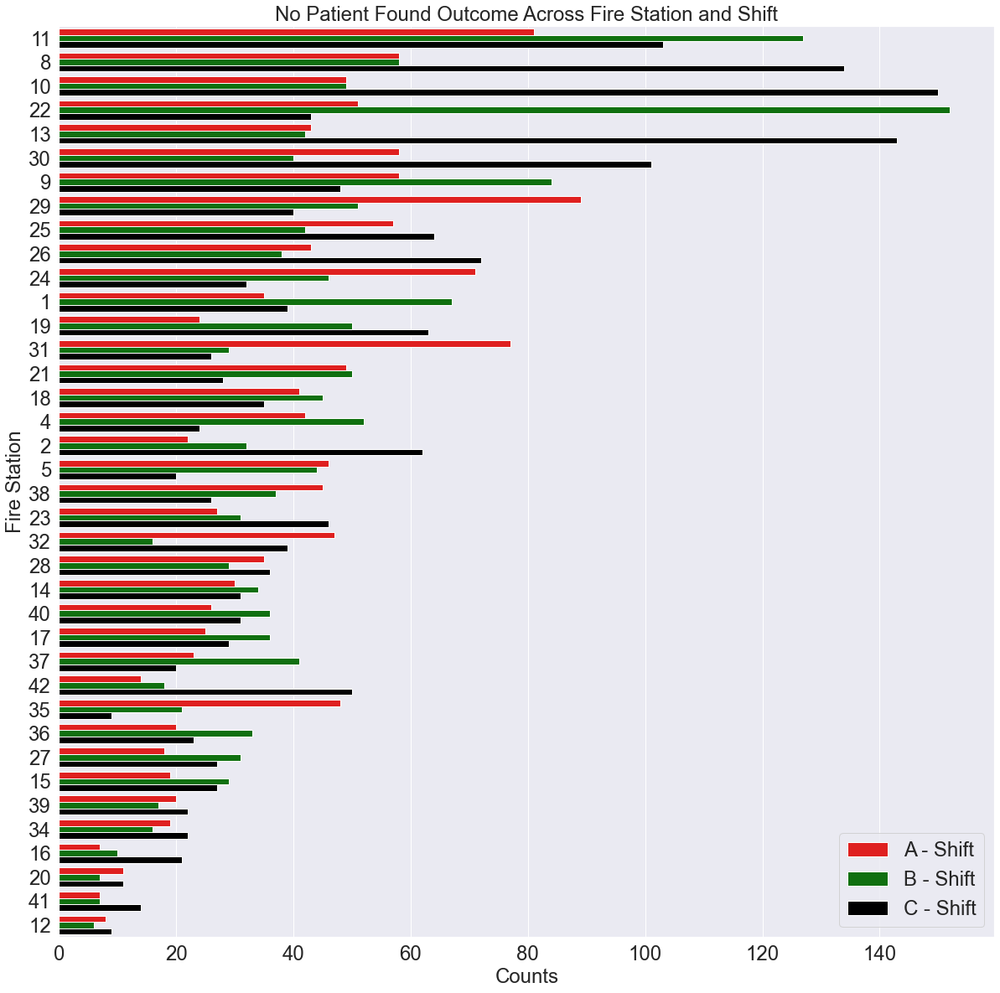

In [18]:
q4_vis.presentation_frequency_plot_figures('No Patient Found')

**Figure 15:** No Patient Found frequency count ranges from 0 to 160 and most of the stations meets or exceeds the 40-count mark. All fire stations accounted for this EMS call outcome across all shifts. In addition, for this particular EMS call outcome shift C (1.7k) have most of the counts, followed by shift B (1.5k) and shift A (1.4k).

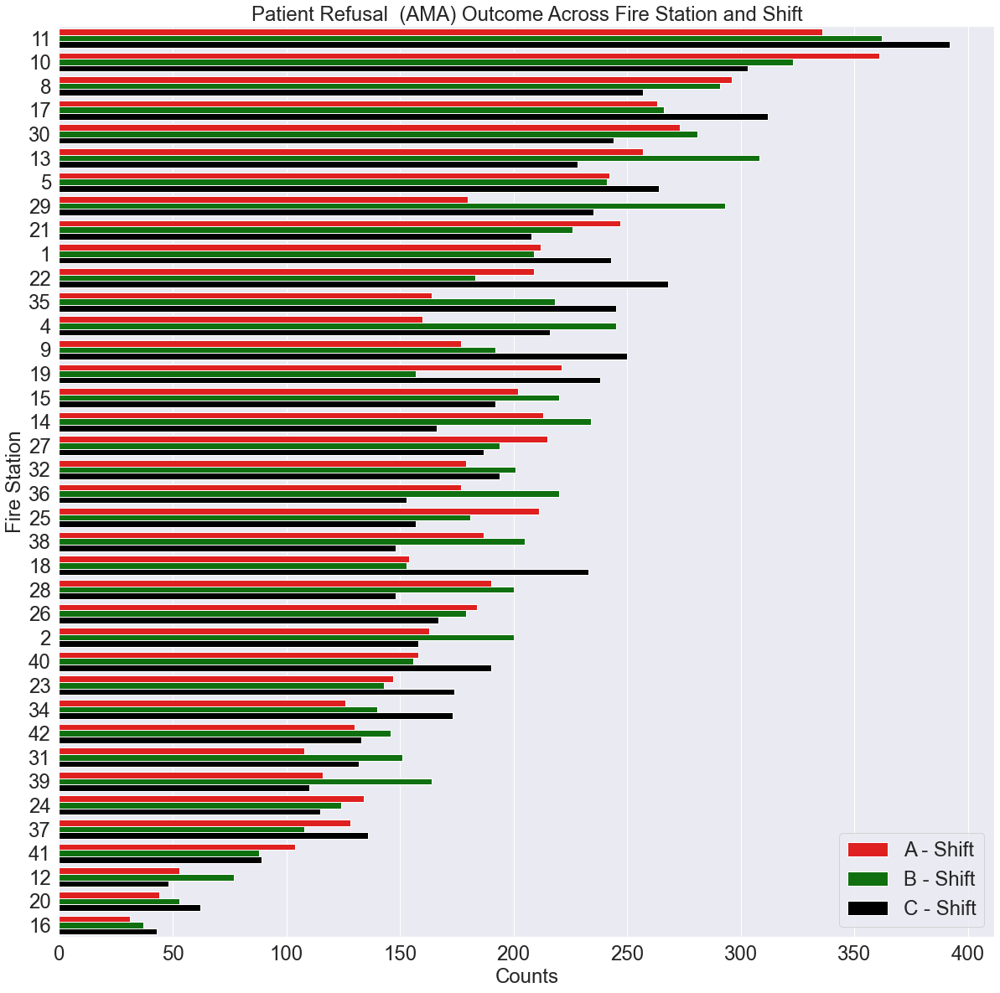

In [19]:
q4_vis.presentation_frequency_plot_figures('Patient Refusal  (AMA)')

**Figure 16:** Patient Refusal (AMA) frequency count ranges from 0 to 400 and most of the stations meets or exceeds the 200-count mark. All fire stations accounted for this EMS call outcome across all shifts. In addition, for this particular EMS call outcome shift B (7.4k) have most of the counts, followed by shift C (7.2k) and shift A (7.0k).

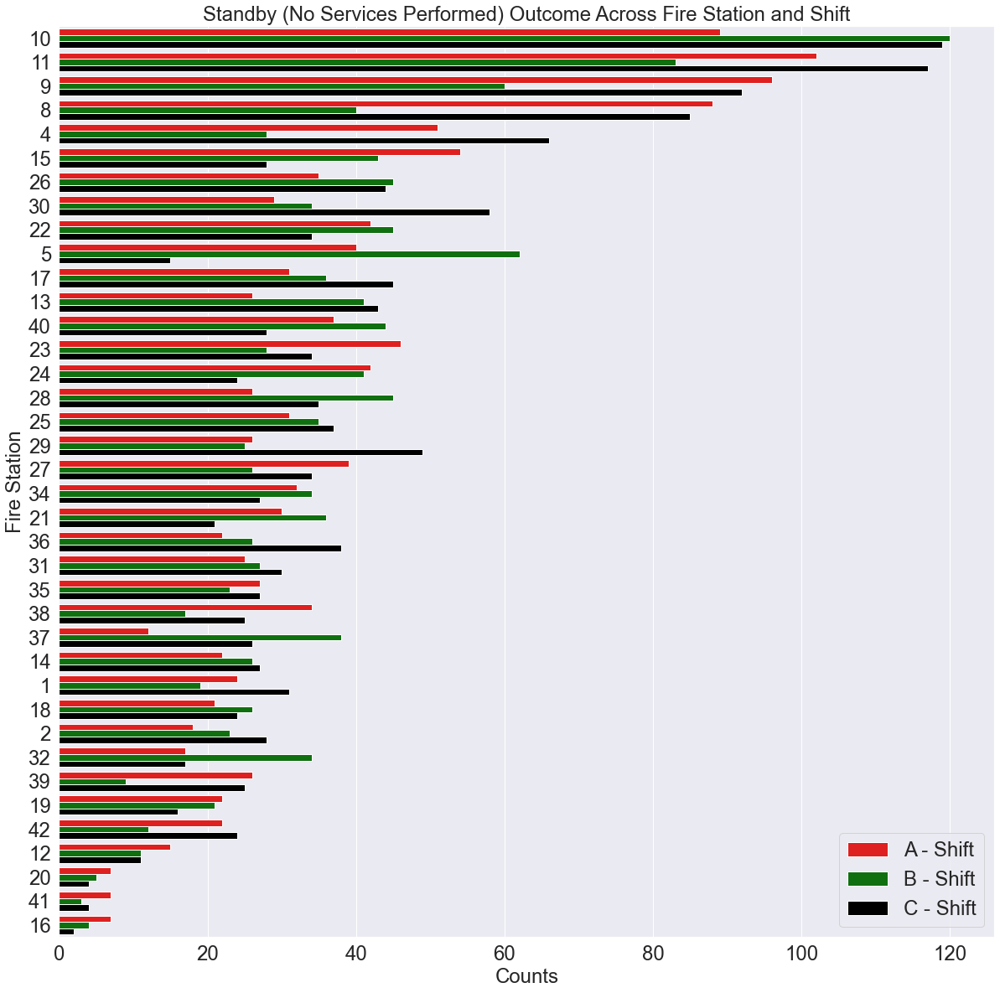

In [20]:
q4_vis.presentation_frequency_plot_figures('Standby (No Services Performed)')

**Figure 17:** Standby (No Services Performed) frequency count ranges from 0 to 120 and most of the stations meets on the 20-count mark and 40-count mark. All fire stations accounted for this EMS call outcome across all shifts. In addition, for this particular EMS call outcome shift C (1.4k) have most of the counts, followed by shift A (1.3k) and shift B (1.3k).

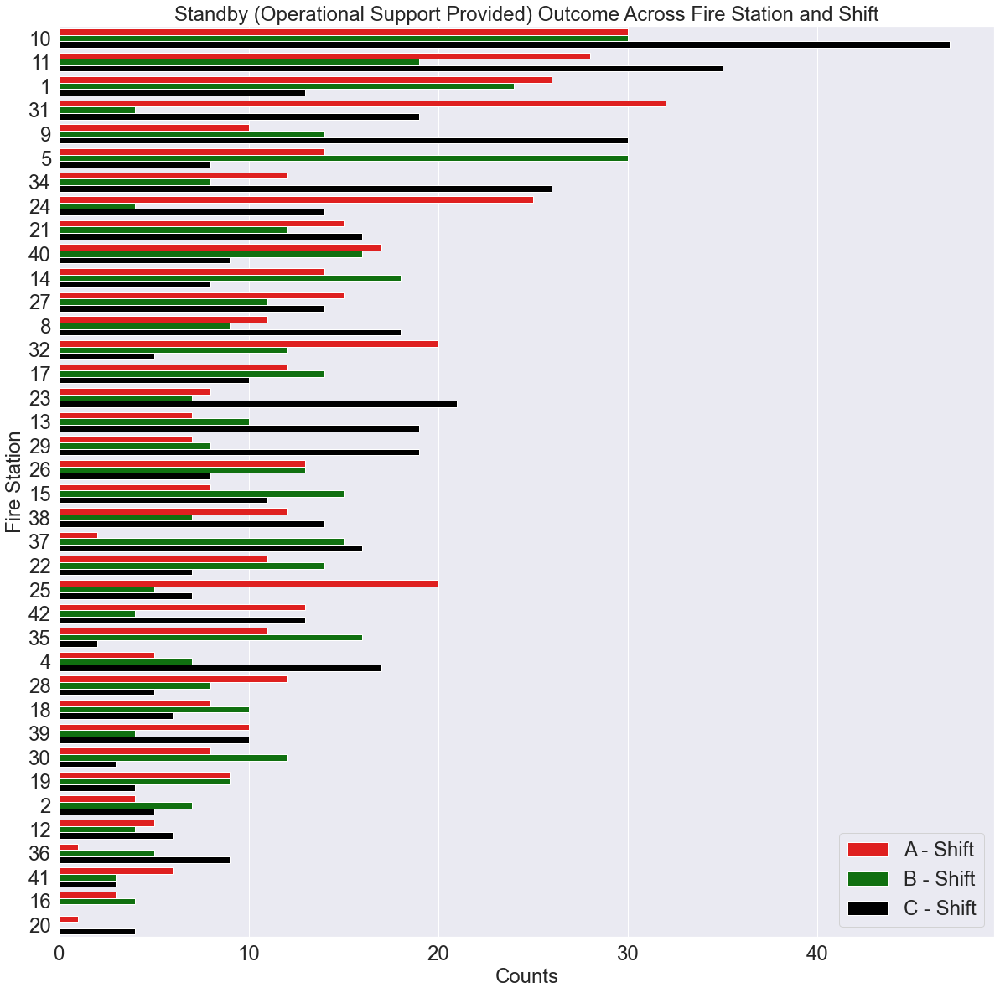

In [21]:
q4_vis.presentation_frequency_plot_figures('Standby (Operational Support Provided)')

**Figure 18:** Standby (Operational Support Provided) frequency count ranges from 0 to 50 and most of the stations meets or exceeds the 10-count mark. Fire stations 16 and 20 shows this EMS call outcome only in 2 of the 3 possible shifts. In addition, for this particular EMS call outcome shift C (481) have most of the counts, followed by shift A (465) and shift B (412).

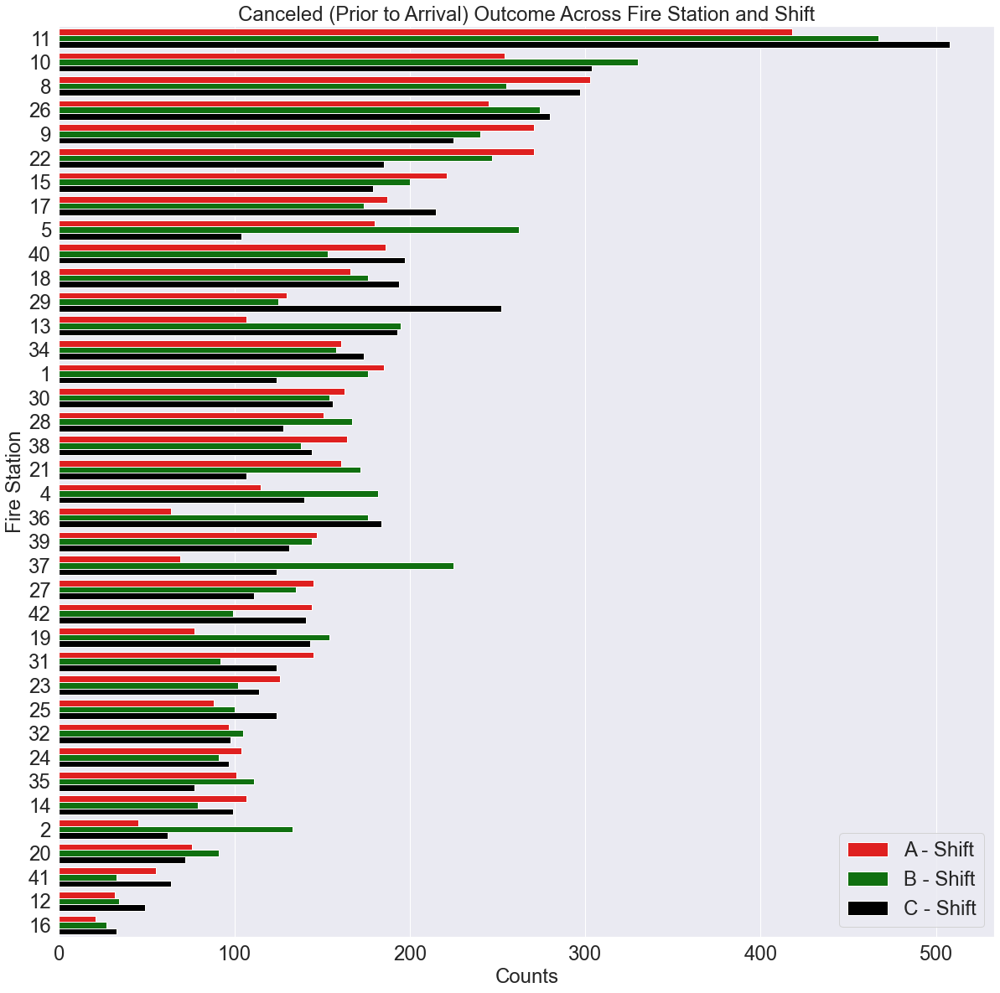

In [22]:
q4_vis.presentation_frequency_plot_figures('Canceled (Prior to Arrival)')

**Figure 19:** Canceled (Prior to Arrival) frequency count ranges from 0 to 500 and most of the stations meets or exceeds the 100-count mark. All fire stations accounted for this EMS call outcome across all shifts. In addition, for this particular EMS call outcome shift B (6.2k) have most of the counts, followed by shift C (5.9k) and shift A (5.7k).

### Insights
* Each EMS call outcome appears to be distributed similarly across the fire stations with slight differences across shifts.
* The frequency plots for each EMS call outcome offer details that allow the differences in shifts to be more easily observed.
### Overall Summary 
* Treated & Transported is the most frequent patient outcome recorded across all stations.
* In general, shift C (82.8k) has the highest count across all stations, followed by shift B (82.7k) and shift A (81.4k)
* As noted in the violin plot (Figure 15), the patient outcome count is not the same across all shifts.
* All outcomes were recorded in all shifts, except for the EMS call outcomes of Treated, Transferred Care, Standby (Operational Support Provided), Patient Dead at Scene (EMS CPR Attempted), and EMS Assist (Other Agency) where some stations recorded this outcome in only one or two shifts.

### Is there a relationship between Treated & Transported, and Treated, Transferred Care EMS call outcomes?


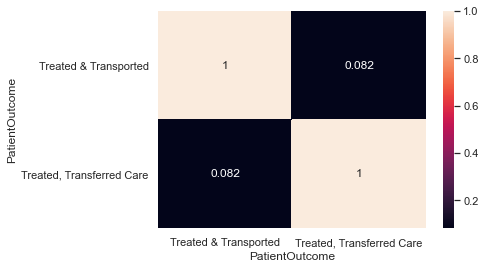

In [23]:
import pandas as pd
import numpy as np
import seaborn as sns

# Get Data Frame for Q4
df = q4_vis.q4_data_frame()

# Add columns that maybe useful
df['StationShift'] = df['FireStation'].astype('str').str.zfill(2)
df['StationShift'] = df['StationShift'] + '-' + df['Shift'].apply(lambda x: x[0])
df['Count'] = 1

# Select only the 2 patient outcomes we are comparing
df = df[df['PatientOutcome'].isin(['Treated & Transported','Treated, Transferred Care'])]

# Group the new Q4 Data Frame
col_grp = ['StationShift', 'FireStation', 'Shift', 'PatientOutcome']
df_grp = df.groupby(by=col_grp).sum()

# Remove the PatientOutcomeCode
df_grp = df_grp.drop(columns=['PatientOutcomeCode'])

# Reset index
df_grp = df_grp.reset_index()

# Create Pivot Table
tab = pd.pivot_table(data=df_grp, 
                     index='StationShift', 
                     columns='PatientOutcome', 
                     values='Count', 
                     fill_value=0)

# Add a column to show the percentage value instead of the frequency count

tab['Treated & Transported - Percent'] = tab['Treated & Transported']\
                                            .apply(lambda x: x/sum(tab['Treated & Transported']))
tab['Treated, Transferred Care - Percent'] = tab['Treated, Transferred Care']\
                                                .apply(lambda x: x/sum(tab['Treated, Transferred Care']))

# The correlation was calculated for both values (i.e., counts and percentages) and in both
# cases the correlation value was the same. For this reason, the correlation plot will be shown
# using the frequency counts only.

corr_cols = ['Treated & Transported', 'Treated, Transferred Care']
sns.heatmap(tab[corr_cols].corr(), annot=True)

In [24]:
# Query to obtain frequency counts for 'Treated & Transported' and 'Treated, Transferred Care'
# per stations
df = q4_vis.q4_data_frame()

q1 = df['FireStation'] == 1
q2 = df['PatientOutcome'] == 'Treated & Transported'
q3 = df['PatientOutcome'] == 'Treated, Transferred Care'

df[q1 & q3].shape[0]

143